In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
import matplotlib.colors as mcolors

from netam.sequences import translate_sequences, AA_STR_SORTED
from netam.framework import load_crepe

from dnsmex import dxsm_data
from dnsmex.local import localify

figures_dir = localify("FIGURES_DIR")

In [2]:
retrain_comparison_df = pd.read_csv("../output/dasm_simulation_retrain_model_compare.csv")
retrain_comparison_df["train_data"] = list(nickname.split("-")[1] for nickname in retrain_comparison_df["model_nickname"])
dataset_set = set(retrain_comparison_df["train_data"])
df_dict = {name: dxsm_data.pcp_df_of_multiname(name) for name in dataset_set}
df_sizes = {name: len(df) for name, df in df_dict.items()}

Loading /home/wdumm/data/v3/tang-deepshm-prod-NoWinCheck_igh_pcp_2024-10-29_MASKED_NI_ConsCys_no-naive_DXSMVALID.csv.gz
Filtering out problematic pairs of sample_id and clonal families [('B13', '77'), ('CLL1697', '43875'), ('CLL2056', '18535')]
Loading /home/wdumm/data/v3/v3convert_vanwinkle-170-igh_pcp_2025-03-05_MASKED_NI_train_no-naive_DXSMVALID_ConsCys.csv.gz
Loading /home/wdumm/data/v3/wyatt-10x-1p5m_fs-all-NoWinCheck-UnmutInv-GTR-paired-merged_pcp_2024-11-21_DXSMVALID_no-naive_ConsCys_HL.csv.gz
Filtering out problematic pairs of sample_id and clonal families [('d4', '213393')]
Loading /home/wdumm/data/v3/v3convert_vanwinkle-170-igk_pcp_2025-02-22_MASKED_NI_train_DXSMVALID_ConsCys_no-naive_downsample_500k_CONCAT_vanwinkle-170-igl_pcp_2025-02-25_MASKED_NI_train_DXSMVALID_ConsCys_no-naive_downsample_500k.csv.gz
Loading /home/wdumm/data/simulations/v3/dasm_paired_SIM_v2tang-2025-6-17_NI_no-naive_ConsCys_downsample_337k_CONCAT_dasm_paired_SIM_v1vanwinkleheavy-2025-6-17_NI_no-naive_Con

In [3]:
retrain_comparison_df["train_data_size"] = [df_sizes[name] for name in retrain_comparison_df["train_data"]]

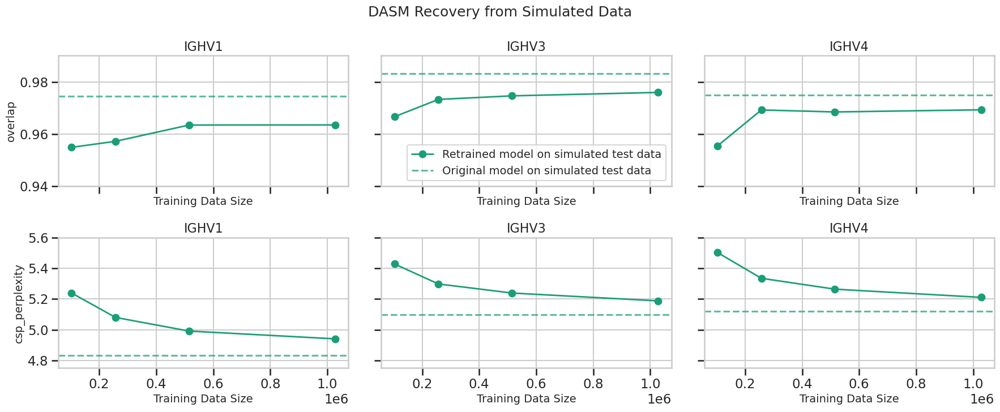

In [4]:

# Set style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("talk")


# Map training sets to their sizes (for correct x-axis ordering)
train_set_order = dict(sorted(df_sizes.items(), key=lambda it: it[1]))

# Set style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("talk")

# Create figure with 1 row and 3 columns (V gene families)
fig, axes = plt.subplots(2, 3, figsize=(18, 7), sharex=True, sharey='row')
fig.subplots_adjust(wspace=0.1)

# Define V families and test datasets
v_families = ['IGHV1', 'IGHV3', 'IGHV4']
test_datasets = ['rodriguezDasmPairedSim']
test_dataset_names = ['simulated test data']
original_train_data = "v1tangCC+v1vanwinkleheavyTrainCC+v1jaffePairedCC+v1vanwinklelightTrainCC1m"
colors = ['#1b9e77', '#d95f02']  # Blue for real test data, Orange for simulated test data
model_type = 'dasm_1m'

# Loop through V families (columns)
for col_idx, v_family in enumerate(v_families):
    for row_idx, plot_column in enumerate(["overlap", "csp_perplexity"]):
        ax = axes[row_idx][col_idx]
        
        # Get reference values from model trained on v1jaffe+v1tang
        reference_vals = {}
        for test_dataset in test_datasets:
            reference_df = retrain_comparison_df[
                (retrain_comparison_df['data_description'] == f"{test_dataset} {v_family}") &
                (retrain_comparison_df['model_nickname'].str.startswith(f"{model_type}-")) &
                (retrain_comparison_df['train_data'] == original_train_data)
            ]
            if not reference_df.empty:
                reference_vals[test_dataset] = reference_df[plot_column].values[0]
        
        # Plot data for each test dataset
        for i, (test_dataset, test_dataset_name) in enumerate(zip(test_datasets, test_dataset_names)):
            # Filter for this test dataset and V family, excluding the reference training set
            df_subset = retrain_comparison_df[
                (retrain_comparison_df['data_description'] == f"{test_dataset} {v_family}") & 
                (retrain_comparison_df['model_nickname'].str.startswith(f"{model_type}-")) &
                (retrain_comparison_df['train_data'] != original_train_data)
            ]
            
            # Sort by train_data_size
            df_subset = df_subset.sort_values('train_data_size')
            
            # Plot the overlap values
            ax.plot(df_subset['train_data_size'], df_subset[plot_column], 
                    'o-', color=colors[i], linewidth=2, 
                    label=f"Retrained model on {test_dataset_name}")
            
            # Add a horizontal line for the reference performance
            if test_dataset in reference_vals:
                ax.axhline(y=reference_vals[test_dataset], color=colors[i], 
                        linestyle='--', alpha=0.7,
                        label=f"Original model on {test_dataset_name}")
        
        # Set titles and labels
        ax.set_title(f"{v_family}", fontsize=16)
        if col_idx == 0:
            ax.set_ylabel(plot_column, fontsize=14)
        ax.set_xlabel('Training Data Size', fontsize=14)
        
        # Set y-axis limits for better visualization
        if plot_column == "overlap":
            ax.set_ylim(0.94, 0.99)
        else:
            ax.set_ylim(4.75, 5.6)
        
        # Add legend only to the first subplot
        if (col_idx, row_idx) == (1, 0):
            ax.legend(loc='lower right', frameon=True, fontsize=14)

plt.tight_layout()

# Add an overall title
fig.suptitle('DASM Recovery from Simulated Data', 
             fontsize=18, y=1.05)

plt.savefig('../output/dasm_retrain_comparison_lineplot.svg', dpi=300, bbox_inches='tight')
plt.show()

In [43]:
def stratified_downsample(in_df, n_samples):
    df = in_df.copy().reset_index(drop=True)
    total_rows = len(df)
    if n_samples > total_rows:
        return df
    indices = np.linspace(0, total_rows-1, n_samples).astype(int)
    return df.iloc[indices].reset_index(drop=True)

In [44]:
# TODO this is just a placeholder for the actual data
v2phad_df = dxsm_data.pcp_df_of_multiname("v2jaffePairedCC")
# # Uncomment this to use phad data when available:
# v2phad_df = dxsm_data.pcp_df_of_multiname("v2phadCC")
sequence_panel = stratified_downsample(v2phad_df, 1000)
# sequence_panel = v1rodriguez_df.copy()
# sequence_panel = v1rodriguez_df.head(100)
sequence_panel = sequence_panel.drop(columns=["child_heavy", "child_name", "parent_name"])
sequence_panel["aa_parent_heavy"] = translate_sequences(sequence_panel["parent_heavy"])
sequence_panel["aa_parent_light"] = translate_sequences(sequence_panel["parent_light"])

Loading /home/wdumm/data/v3/wyatt-10x-1p5m_fs-all-UnmutInv_paired-merged_pcp_2024-11-22_no-naive_NI_ConsCys_HL.csv.gz


In [45]:
original_crepe_prefix = localify(f"DASM_TRAINED_MODELS_DIR/dasm_1m-{original_train_data}-joint")
retrain_comparison_df["model_path"] = [localify(f"DASM_TRAINED_MODELS_DIR/{name}") for name in retrain_comparison_df["model_nickname"]]
retrained_crepe_prefixes, retraining_data_quantities = zip(*sorted(
        {
            it for it in zip(retrain_comparison_df["model_path"], retrain_comparison_df["train_data_size"])
            if it[0] != original_crepe_prefix and "dasm_1m" in it[0]
        }, key=lambda it: it[1]
    ))
print(original_crepe_prefix)
print(retrained_crepe_prefixes)

/home/wdumm/re/dnsm-experiments-1/dasm-train/trained_models/dasm_1m-v1tangCC+v1vanwinkleheavyTrainCC+v1jaffePairedCC+v1vanwinklelightTrainCC1m-joint
('/home/wdumm/re/dnsm-experiments-1/dasm-train/trained_models/dasm_1m-heavyDasmPairedSim40k+pairedDasmPairedSim11k+lightDasmPairedSim52k-joint', '/home/wdumm/re/dnsm-experiments-1/dasm-train/trained_models/dasm_1m-heavyDasmPairedSim100k+pairedDasmPairedSim27k+lightDasmPairedSim130k-joint', '/home/wdumm/re/dnsm-experiments-1/dasm-train/trained_models/dasm_1m-heavyDasmPairedSim201k+pairedDasmPairedSim54k+lightDasmPairedSim260k-joint', '/home/wdumm/re/dnsm-experiments-1/dasm-train/trained_models/dasm_1m-heavyDasmPairedSim402k+pairedDasmPairedSim108k+lightDasmPairedSim518k-joint')


In [46]:
original_crepe = (load_crepe(original_crepe_prefix))
retrained_crepes = [(load_crepe(pref)) for pref in retrained_crepe_prefixes]

In [47]:
sequence_pair_panel = list(zip(sequence_panel["aa_parent_heavy"], sequence_panel["aa_parent_light"]))
original_crepe_evaluations = original_crepe(sequence_pair_panel)
retrained_crepe_evaluations = [crepe(sequence_pair_panel) for crepe in retrained_crepes]

In [48]:
transfer_columns = [col for col in sequence_panel.columns if col not in ["aa_parent_heavy", "aa_parent_light", "parent_heavy"]]
df_data = {"parent_aa": [], "aa_idx": [], "seq_idx": [], "chain_check": [], "target_aa_check": []}
df_data.update({col: [] for col in transfer_columns})
for seq_idx, row in sequence_panel.iterrows():
    for aa_chain, chain_name in zip((row["aa_parent_heavy"], row["aa_parent_light"]), ("heavy", "light")):
        for zero_idx, aa in enumerate(aa_chain):
            df_data["parent_aa"].extend([aa] * 20)
            df_data["aa_idx"].extend([zero_idx + 1] * 20)
            df_data["seq_idx"].extend([seq_idx] * 20)
            df_data["chain_check"].extend([chain_name] * 20)
            df_data["target_aa_check"].extend(list(AA_STR_SORTED))
            for col in transfer_columns:
                df_data[col].extend([row[col]] * 20)

selection_factor_df = pd.DataFrame(df_data)
selection_factor_df["original_sf"], selection_factor_df["chain"], selection_factor_df["parent_aa"], selection_factor_df["target_aa"] = zip(
    *[
        (float(sf.detach().numpy()), chain_name, parent_aa, target_aa)
        for pred_pair, parent_seq_pair in zip(original_crepe_evaluations, sequence_pair_panel)
        for chain_preds, chain_name, chain_seq in zip(pred_pair, ["heavy", "light"], parent_seq_pair)
        for site_sfs, parent_aa in zip(chain_preds, chain_seq)
        for sf, target_aa in zip(site_sfs, AA_STR_SORTED)
    ]
)
for idx, vals in enumerate(retrained_crepe_evaluations):
    selection_factor_df[f"retrained_sf_{idx+1}"] = [
        float(sf.detach().numpy())
        for pred_pair, parent_seq_pair in zip(vals, sequence_pair_panel)
        for chain_preds, chain_name, chain_seq in zip(pred_pair, ["heavy", "light"], parent_seq_pair)
        for site_sfs, parent_aa in zip(chain_preds, chain_seq)
        for sf, target_aa in zip(site_sfs, AA_STR_SORTED)
    ]
    

selection_factor_df = selection_factor_df[selection_factor_df["parent_aa"] != selection_factor_df["target_aa"]]

In [49]:
assert (selection_factor_df["chain_check"] == selection_factor_df["chain"]).all(), "Chain check mismatch!"
assert (selection_factor_df["target_aa_check"] == selection_factor_df["target_aa"]).all(), "Target AA check mismatch!"

In [50]:
print("heavy chain v-family usage:")
for v_family in selection_factor_df.v_family_heavy.unique():
    print(v_family, len(selection_factor_df[selection_factor_df.v_family_heavy == v_family]))
print("light chain v-family usage:")
for v_family in selection_factor_df.v_family_light.unique():
    print(v_family, len(selection_factor_df[selection_factor_df.v_family_light == v_family]))

v_families_heavy = ["IGHV1", "IGHV3", "IGHV4"]
v_families_igk = [
    "IGKV1",
    "IGKV3",
]
v_families_igl = [
    "IGLV1",
    "IGLV2",
]

heavy chain v-family usage:
IGHV7 39520
IGHV3 2520996
IGHV4 982129
IGHV1 492765
IGHV6 75525
IGHV2 79268
IGHV5 197505
light chain v-family usage:
IGKV1D 331778
IGLV1 517142
IGKV3 1051175
IGKV1 696673
IGLV2 691809
IGKV2D 142500
IGLV7 108338
IGKV2 184927
IGLV6 48146
IGKV4 334324
IGLV3 170677
IGLV5 17936
IGLV4 31160
IGLV8 26429
IGKV6 12958
IGLV10 17366
IGKV5 4370


In [51]:
def plot_selection_factor_comparison(df, ax, x_name, y_name, limits, hexbin=True, plot_regression=False, **plot_kwargs):
    df = df.copy()
    if hexbin:
        hexbin_obj = ax.hexbin(
            df[x_name],
            df[y_name],
            zorder=-1,
            cmap="Purples",
            gridsize=(25, 15),
            **plot_kwargs,
        )
        ax.get_figure().colorbar(hexbin_obj, ax=ax, orientation='vertical', label='Count')
    else:
        sns.scatterplot(
            data=df,
            x=x_name,
            y=y_name,
            c="#43147E",
            linewidth=0.0,
            ax=ax,
            s=10,
            alpha=0.03,
            **plot_kwargs,
        )

    # calculate R2
    X = df[x_name].values.reshape(-1, 1)
    y = df[y_name].values

    # R² for y=x line.
    y_pred_identity = X.flatten()  # Predictions are just x values.
    ss_res = np.sum((y - y_pred_identity) ** 2)  # Residual sum of squares.
    ss_tot = np.sum((y - np.mean(y)) ** 2)  # Total sum of squares.
    r2_identity = 1 - (ss_res / ss_tot)
    ax.plot(limits, limits, color="#ecba17", label=f"$y=x$ ($R^2$: {r2_identity:.3f})")

    if plot_regression:
        reg = LinearRegression().fit(X, y)
        r2 = reg.score(X, y)
        Xplot = np.array([[X.min()], [X.max()]])
        ax.plot(Xplot, reg.predict(Xplot), color='#ff6b35', label=f"$R^2$: {r2:.3f}", linestyle="--")


    ax.legend(loc='upper left')
    ax.set_xlabel(x_name)
    ax.set_ylabel(y_name)
    ax.axis('square')
    ax.set_ylim(*limits)
    ax.set_xlim(*limits)
    plt.tight_layout()
    sns.despine()

def format_number(n):
    if n >= 1e6:
        return f"{n/1e6:.0f}M"
    elif n >= 1e3:
        return f"{n/1e3:.0f}K"
    else:
        return str(n)

all_y_cols = [(f"retrained_sf_{i+1}", f"retrained with {format_number(size)}") for i, size in enumerate(retraining_data_quantities)]

first_last_y_cols = [
    all_y_cols[0],
    all_y_cols[-1]
]
def selection_factor_comparison_faceted_fig(y_cols, hexbin=True, log_scale=True, output_file=None, plot_regression=False, v_families=["IGHV1", "IGHV3", "IGHV4"], **plot_kwargs):
    x_col = "original_sf"
    if log_scale:
        limits = (-10, 2.2)
        for y_col, _ in y_cols:
            selection_factor_df[y_col + "_log"] = np.log(selection_factor_df[y_col])
        log_xs = np.log(selection_factor_df[x_col])
        x_col = x_col + "_log"
        transform_string = " log "
        selection_factor_df[x_col] = log_xs
    else:
        transform_string = " "
        limits = (-0.1, 6)

    fig, axs = plt.subplots(len(y_cols), len(v_families), figsize=(7.8 * len(v_families), 6 * len(y_cols)), sharex=True, sharey=True)
    for col_idx, v_family in enumerate(v_families):
        if v_family[2] == "H":
            chain_suffix = "heavy"
        else:
            chain_suffix = "light"
        for row_idx, (y_col, y_name) in enumerate(y_cols):
            ax = axs[row_idx][col_idx]
            if log_scale:
                y_col = y_col + "_log"
            plot_df = selection_factor_df[
                (selection_factor_df[f"v_family_{chain_suffix}"] == v_family)
                & (selection_factor_df["chain"] == chain_suffix)
            ]
            plot_selection_factor_comparison(plot_df, ax, x_col, y_col, limits, hexbin=hexbin, plot_regression=plot_regression, **plot_kwargs)
            if row_idx == len(y_cols) - 1:
                ax.set_xlabel("original" + transform_string + "selection factor")
            else:
                ax.set_xlabel("")
            if col_idx == 0:
                ax.set_ylabel(y_name + transform_string + "selection factor")
            else:
                ax.set_ylabel("")
            if row_idx == 0:
                ax.set_title(v_family)
    
    if output_file is not None:
        fig.savefig(output_file, dpi=300)
    return fig, axs

(<Figure size 2340x1200 with 12 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 103K log selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 1M log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

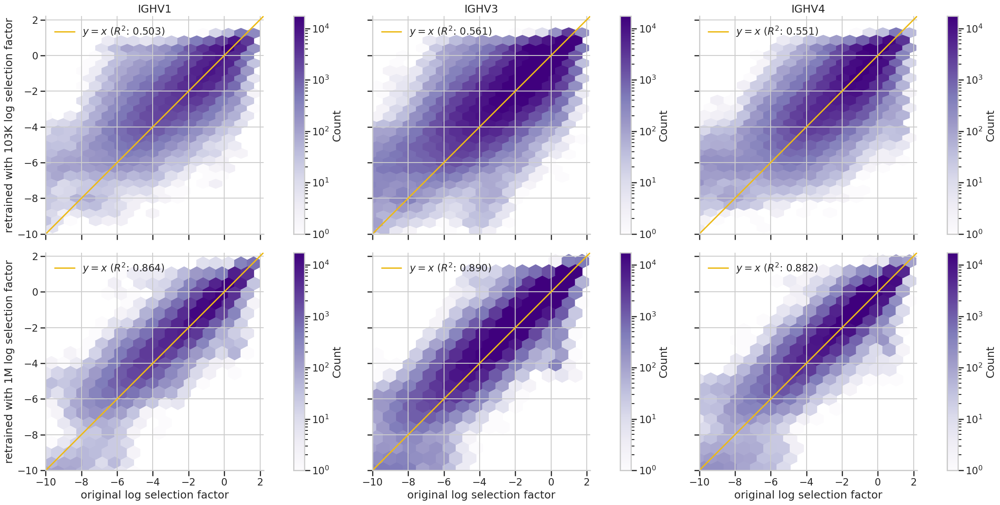

In [52]:
selection_factor_comparison_faceted_fig(first_last_y_cols, v_families=v_families_heavy, hexbin=True, log_scale=True, norm=mcolors.LogNorm(), output_file="../output/dasm_retrain_selection_factor_comparison_heavy.svg")

(<Figure size 3120x1200 with 16 Axes>,
 array([[<Axes: title={'center': 'IGKV1'}, ylabel='retrained with 103K log selection factor'>,
         <Axes: title={'center': 'IGKV3'}>,
         <Axes: title={'center': 'IGLV1'}>,
         <Axes: title={'center': 'IGLV2'}>],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 1M log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

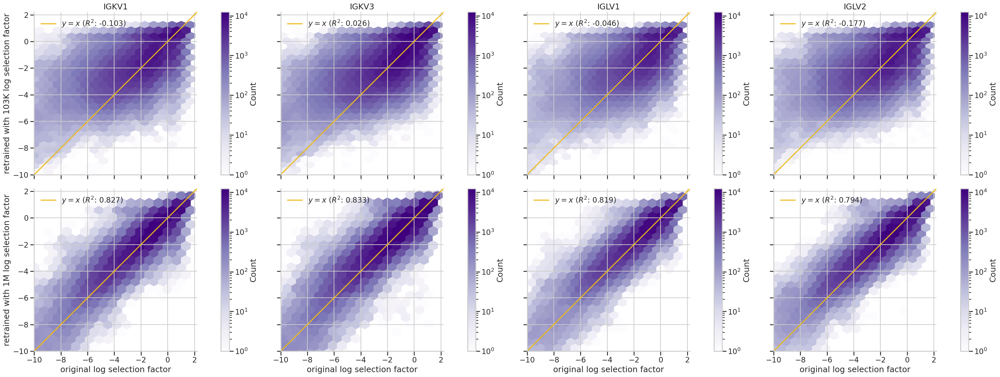

In [53]:
selection_factor_comparison_faceted_fig(first_last_y_cols, v_families=v_families_igk+v_families_igl, hexbin=True, log_scale=True, norm=mcolors.LogNorm(), output_file="../output/dasm_retrain_selection_factor_comparison_light.svg")

(<Figure size 2340x2400 with 24 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 103K log selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 257K log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: ylabel='retrained with 515K log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 1M log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

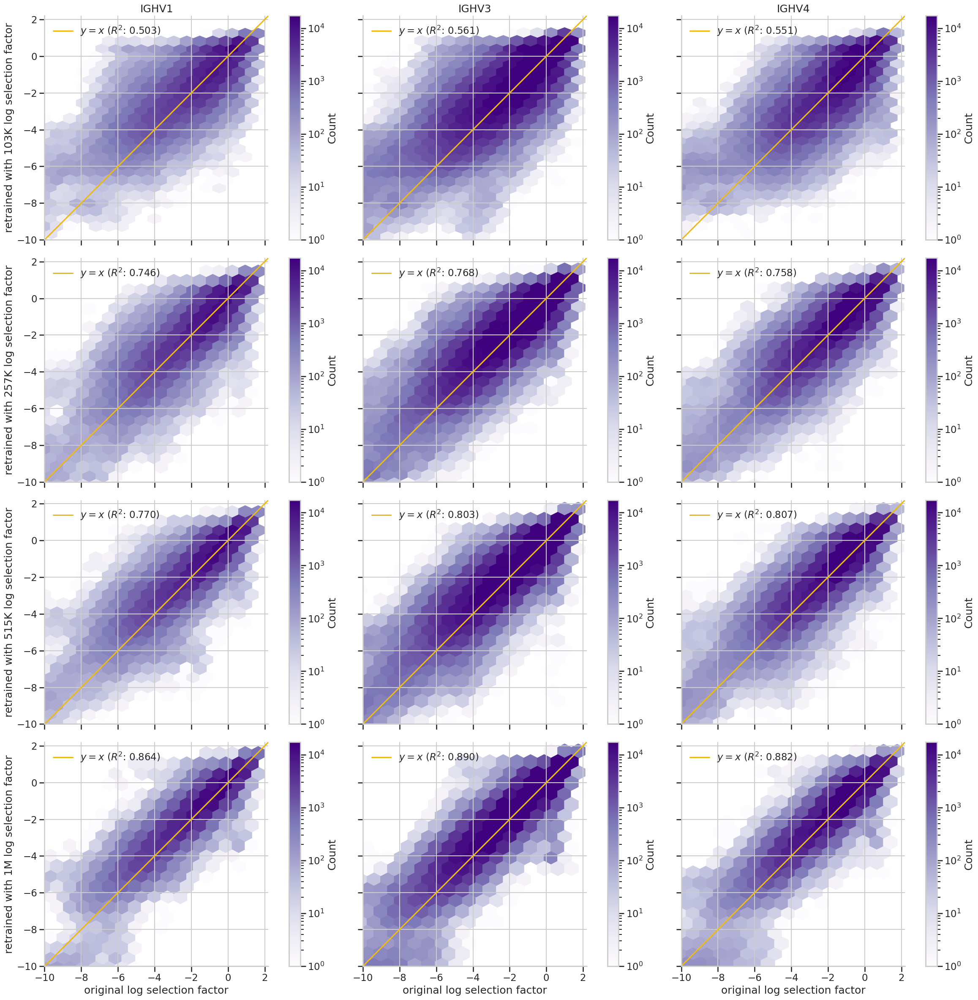

In [54]:

selection_factor_comparison_faceted_fig(all_y_cols, v_families=v_families_heavy, hexbin=True, log_scale=True, norm=mcolors.LogNorm(), output_file="../output/dasm_retrain_selection_factor_comparison_heavy_supp1.svg")

(<Figure size 3120x2400 with 32 Axes>,
 array([[<Axes: title={'center': 'IGKV1'}, ylabel='retrained with 103K log selection factor'>,
         <Axes: title={'center': 'IGKV3'}>,
         <Axes: title={'center': 'IGLV1'}>,
         <Axes: title={'center': 'IGLV2'}>],
        [<Axes: ylabel='retrained with 257K log selection factor'>,
         <Axes: >, <Axes: >, <Axes: >],
        [<Axes: ylabel='retrained with 515K log selection factor'>,
         <Axes: >, <Axes: >, <Axes: >],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 1M log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

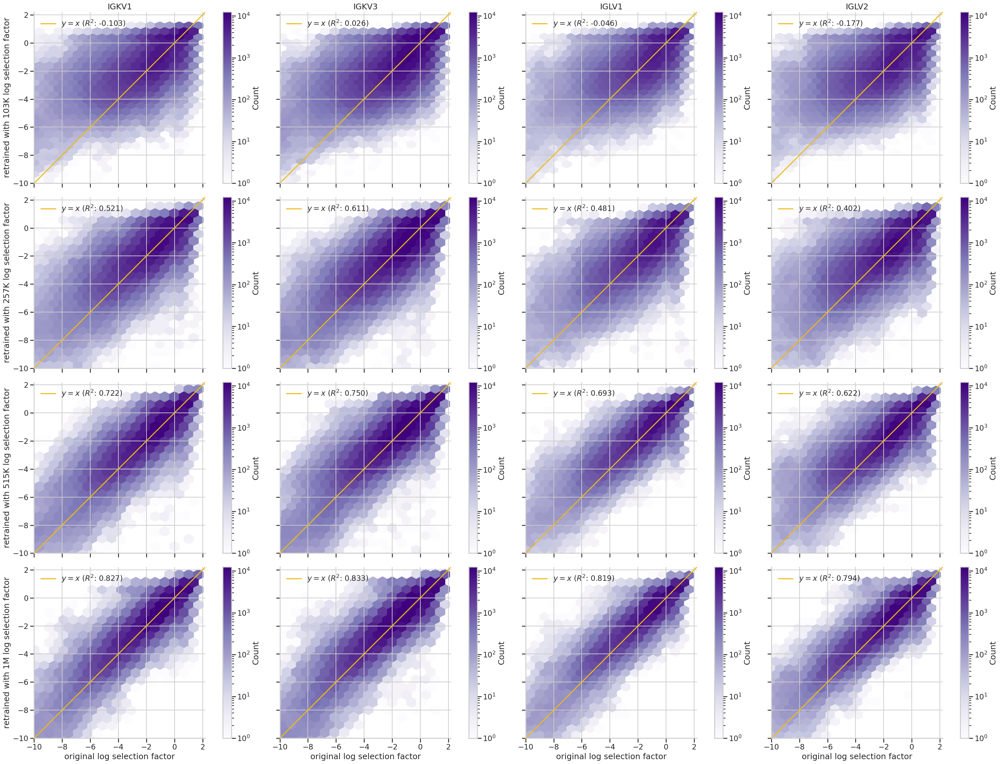

In [55]:
selection_factor_comparison_faceted_fig(all_y_cols, v_families=v_families_igk+v_families_igl, hexbin=True, log_scale=True, norm=mcolors.LogNorm(), output_file="../output/dasm_retrain_selection_factor_comparison_light_supp1.svg")

(<Figure size 2340x2400 with 24 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 103K log selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 257K log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: ylabel='retrained with 515K log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 1M log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

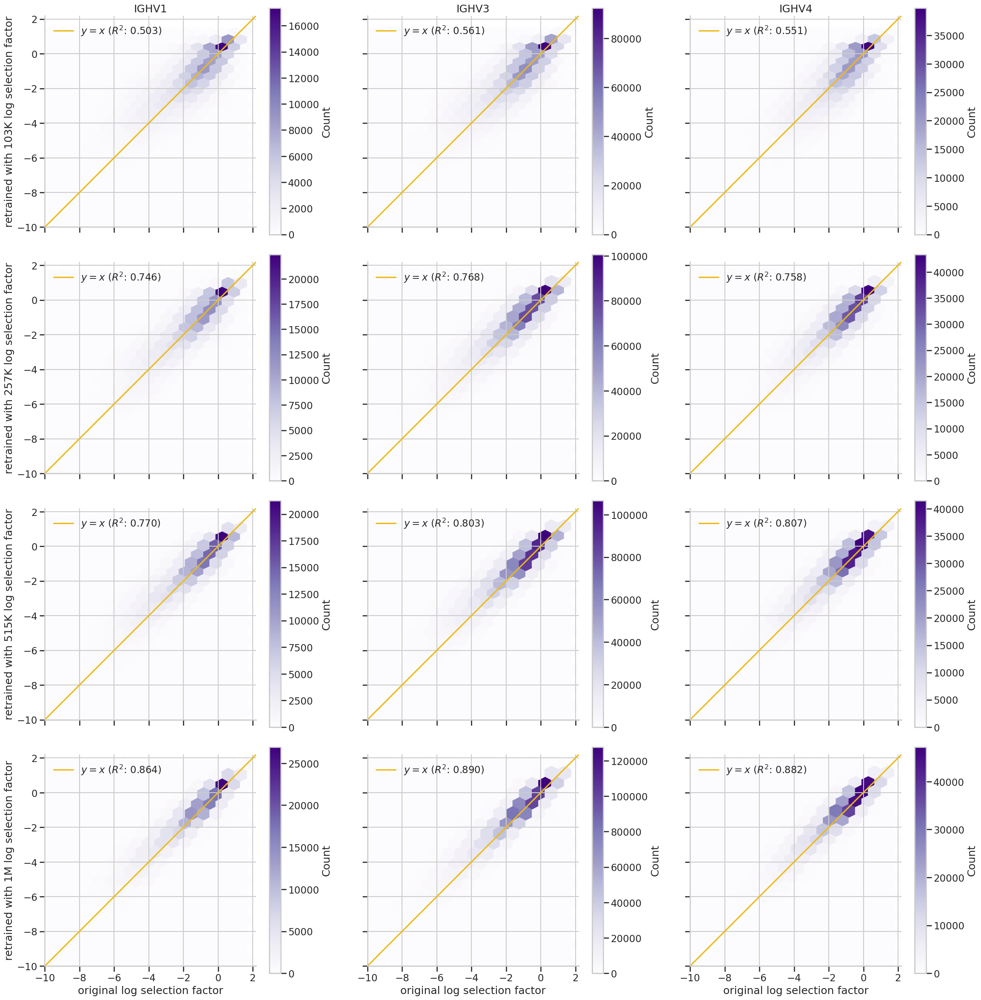

In [56]:
selection_factor_comparison_faceted_fig(all_y_cols, hexbin=True, log_scale=True, output_file="../output/dasm_retrain_selection_factor_comparison_supp2.svg")

(<Figure size 2340x2400 with 24 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 103K selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 257K selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='retrained with 515K selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: xlabel='original selection factor', ylabel='retrained with 1M selection factor'>,
         <Axes: xlabel='original selection factor'>,
         <Axes: xlabel='original selection factor'>]], dtype=object))

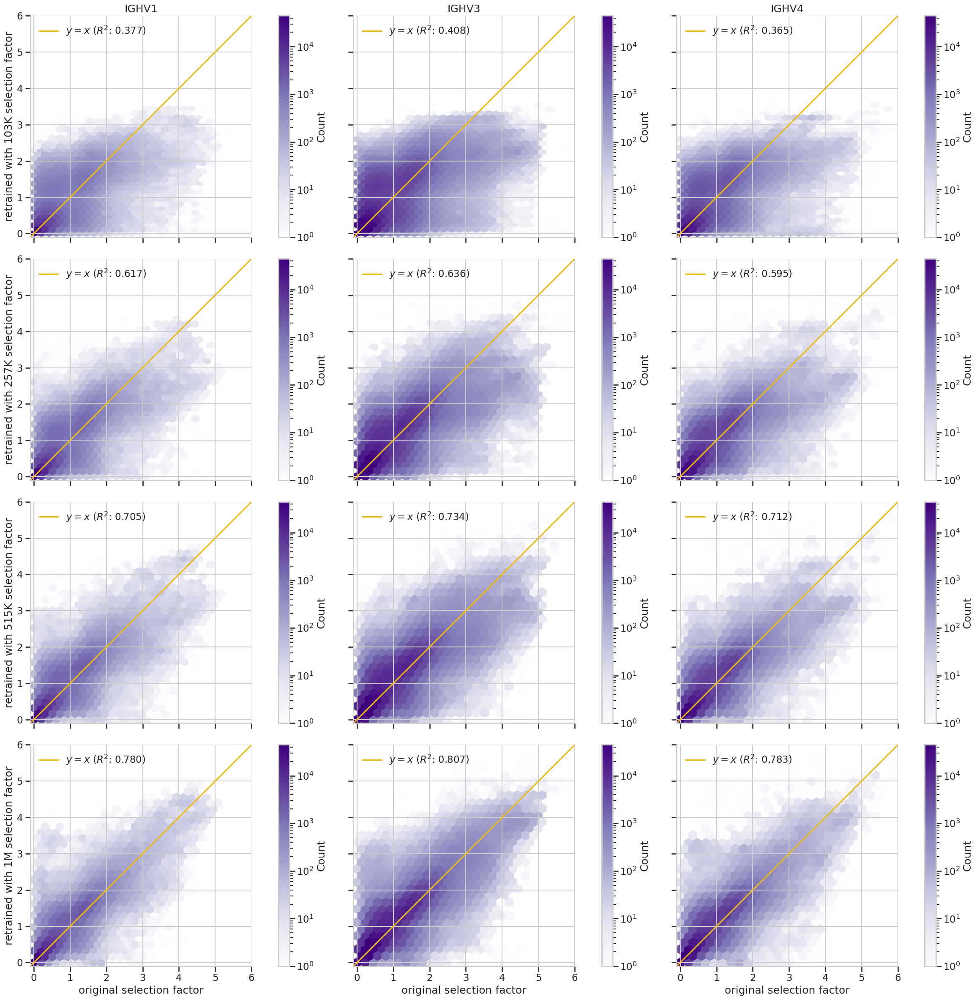

In [57]:
selection_factor_comparison_faceted_fig(all_y_cols, v_families=v_families_heavy, hexbin=True, log_scale=False, norm=mcolors.LogNorm(), output_file="../output/dasm_retrain_selection_factor_comparison_heavy_supp3.svg")

(<Figure size 3120x2400 with 32 Axes>,
 array([[<Axes: title={'center': 'IGKV1'}, ylabel='retrained with 103K selection factor'>,
         <Axes: title={'center': 'IGKV3'}>,
         <Axes: title={'center': 'IGLV1'}>,
         <Axes: title={'center': 'IGLV2'}>],
        [<Axes: ylabel='retrained with 257K selection factor'>, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: ylabel='retrained with 515K selection factor'>, <Axes: >,
         <Axes: >, <Axes: >],
        [<Axes: xlabel='original selection factor', ylabel='retrained with 1M selection factor'>,
         <Axes: xlabel='original selection factor'>,
         <Axes: xlabel='original selection factor'>,
         <Axes: xlabel='original selection factor'>]], dtype=object))

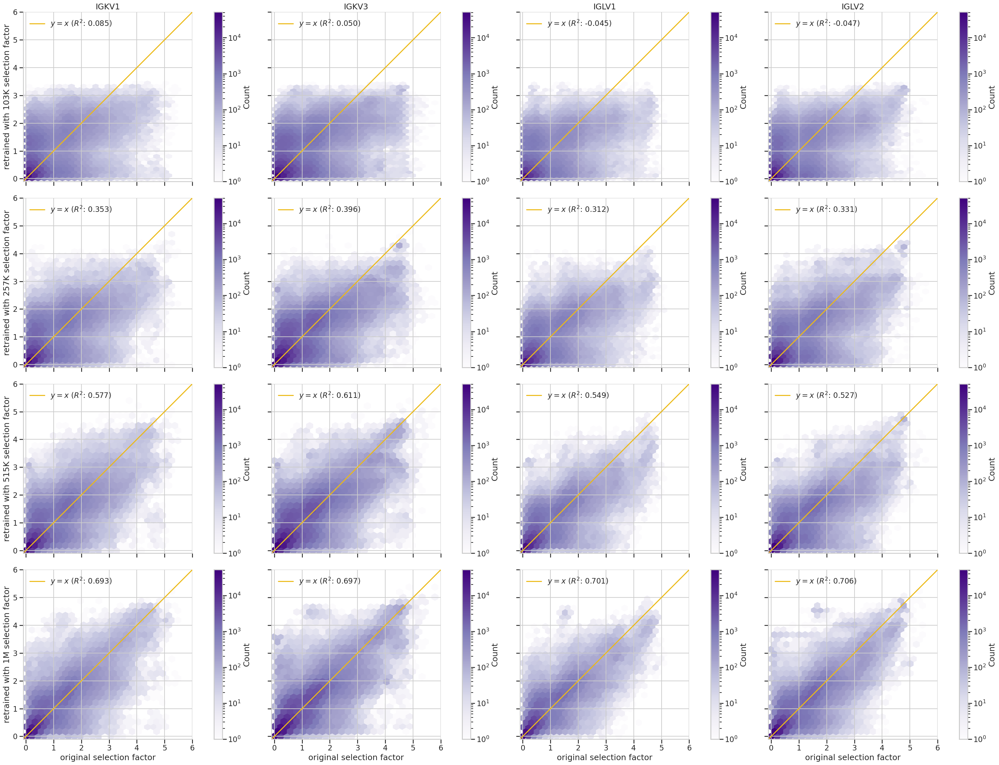

In [58]:
selection_factor_comparison_faceted_fig(all_y_cols, v_families=v_families_igk + v_families_igl, hexbin=True, log_scale=False, norm=mcolors.LogNorm(), output_file="../output/dasm_retrain_selection_factor_comparison_light_supp3.svg")

(<Figure size 2340x2400 with 24 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 103K selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 257K selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='retrained with 515K selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: xlabel='original selection factor', ylabel='retrained with 1M selection factor'>,
         <Axes: xlabel='original selection factor'>,
         <Axes: xlabel='original selection factor'>]], dtype=object))

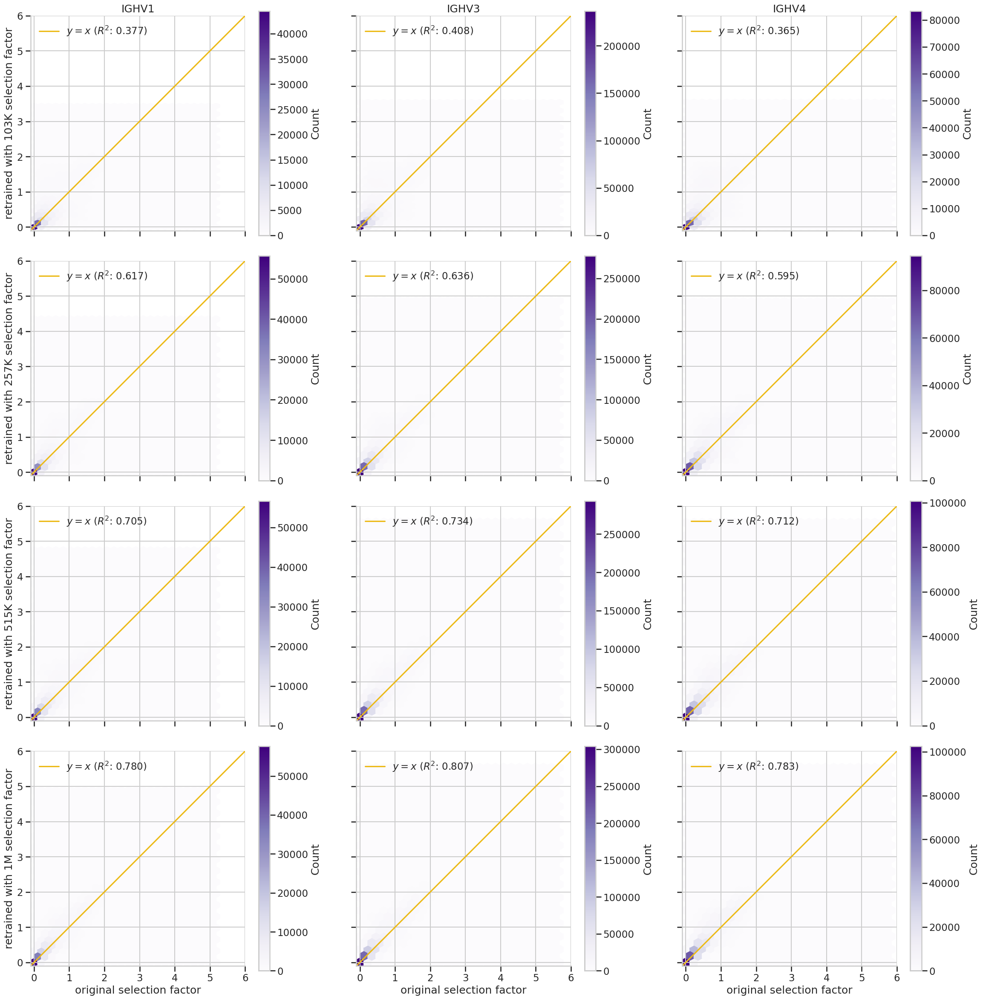

In [59]:
selection_factor_comparison_faceted_fig(all_y_cols, hexbin=True, log_scale=False, output_file="../output/dasm_retrain_selection_factor_comparison_supp4.svg")

(<Figure size 2340x2400 with 12 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 103K log selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 257K log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: ylabel='retrained with 515K log selection factor'>,
         <Axes: >, <Axes: >],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 1M log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

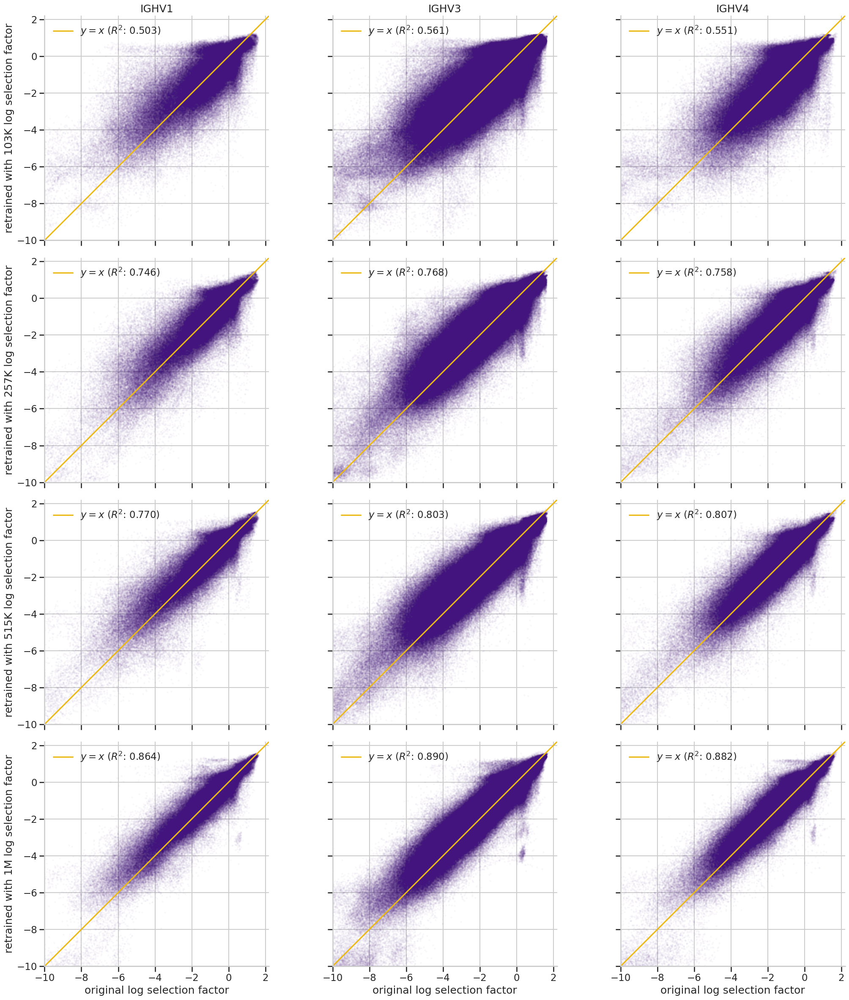

In [60]:
selection_factor_comparison_faceted_fig(all_y_cols, hexbin=False, log_scale=True)

(<Figure size 3120x2400 with 16 Axes>,
 array([[<Axes: title={'center': 'IGKV1'}, ylabel='retrained with 103K log selection factor'>,
         <Axes: title={'center': 'IGKV3'}>,
         <Axes: title={'center': 'IGLV1'}>,
         <Axes: title={'center': 'IGLV2'}>],
        [<Axes: ylabel='retrained with 257K log selection factor'>,
         <Axes: >, <Axes: >, <Axes: >],
        [<Axes: ylabel='retrained with 515K log selection factor'>,
         <Axes: >, <Axes: >, <Axes: >],
        [<Axes: xlabel='original log selection factor', ylabel='retrained with 1M log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>,
         <Axes: xlabel='original log selection factor'>]], dtype=object))

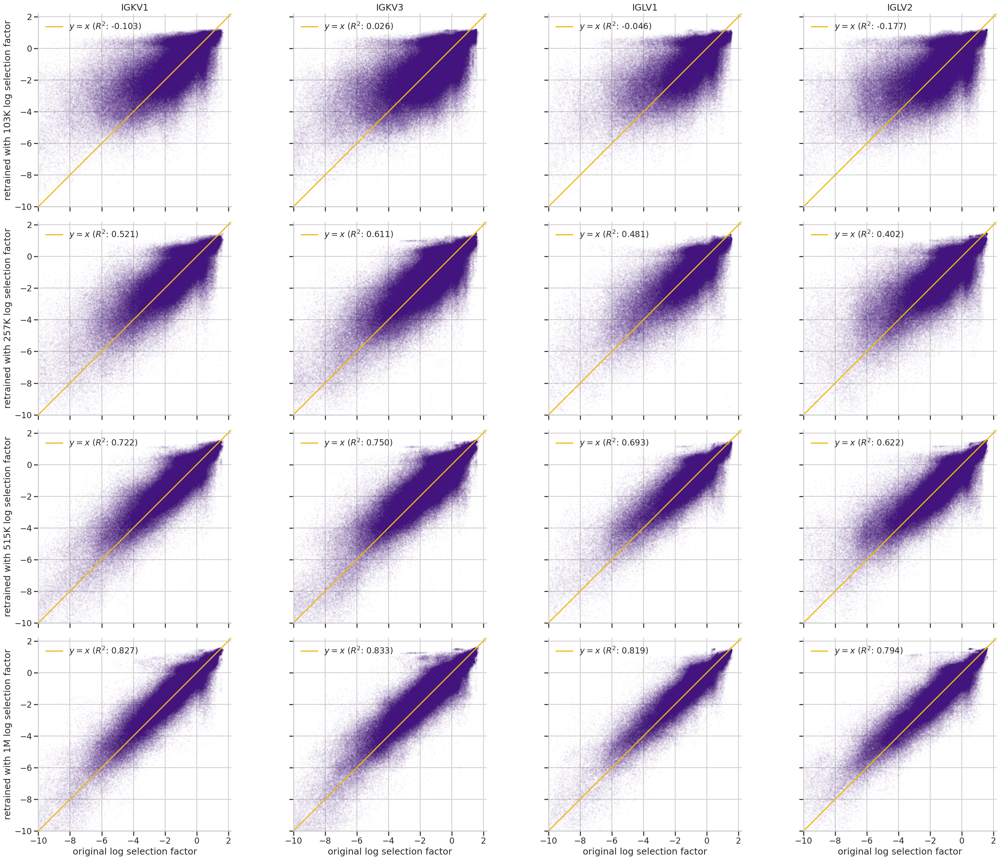

In [62]:
selection_factor_comparison_faceted_fig(all_y_cols, v_families=v_families_igk+v_families_igl, hexbin=False, log_scale=True)

(<Figure size 2340x2400 with 12 Axes>,
 array([[<Axes: title={'center': 'IGHV1'}, ylabel='retrained with 103K selection factor'>,
         <Axes: title={'center': 'IGHV3'}>,
         <Axes: title={'center': 'IGHV4'}>],
        [<Axes: ylabel='retrained with 257K selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: ylabel='retrained with 515K selection factor'>, <Axes: >,
         <Axes: >],
        [<Axes: xlabel='original selection factor', ylabel='retrained with 1M selection factor'>,
         <Axes: xlabel='original selection factor'>,
         <Axes: xlabel='original selection factor'>]], dtype=object))

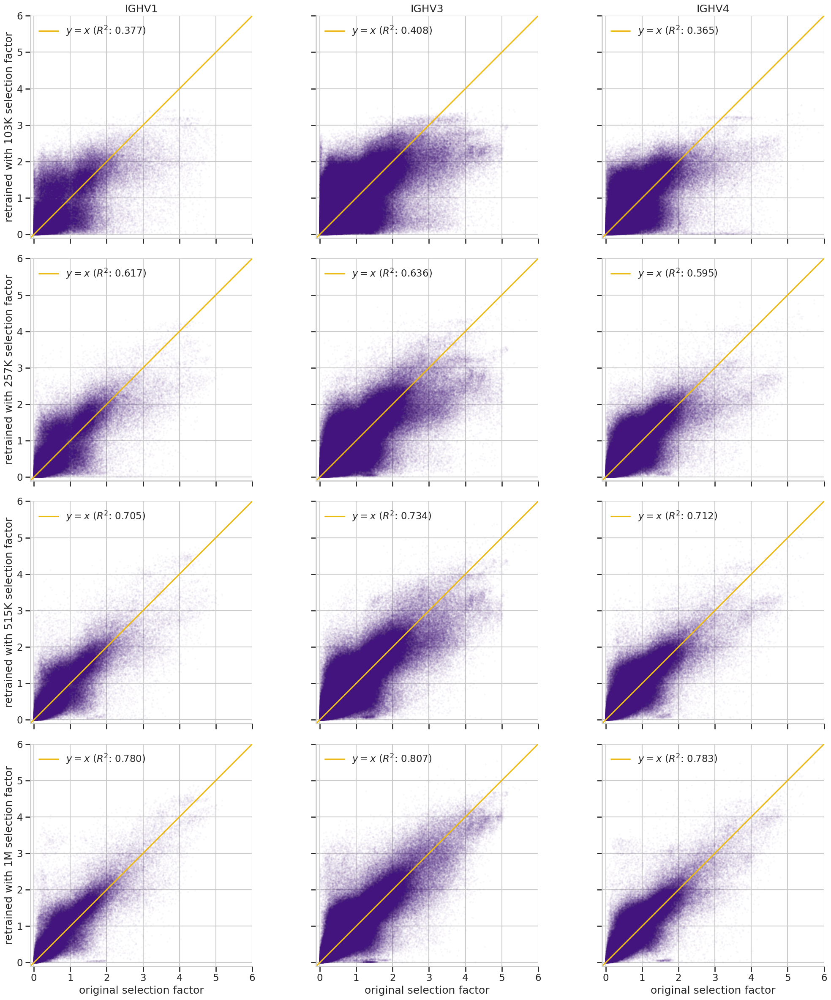

In [61]:

selection_factor_comparison_faceted_fig(all_y_cols, hexbin=False, log_scale=False)